# Train UNet on Point Heatmaps

In [1]:

import skimage, scipy

import matplotlib.pyplot as plt

import sys; sys.path += [".."]  # NOTE find shared modules

from util.preprocess import *
from util.plot import *
from util.onnx import *

import segmentation_models_pytorch as smp
import torch

def norm(x): return (x - x.min()) / (x.max() - x.min())

CUDA = torch.cuda.is_available()
device = torch.device('cuda:0' if CUDA else 'cpu')

print(f"Device: {device}")

Device: cuda:0


In [2]:

dataset = 'third'
imgid = '1'

SLICE = False if CUDA else 512

RGB = norm(skimage.io.imread(f"../data/{dataset}/{imgid}.jpg").astype(np.float32))
if SLICE: RGB = RGB[:SLICE, :SLICE]

# green channel turned out to be the sharpest
G = RGB[..., 1]

RGB2 = norm(skimage.io.imread(f"../data/{dataset}/2.jpg").astype(np.float32))
if SLICE: RGB2 = RGB2[:SLICE, :SLICE]
G2 = RGB2[..., 1]

RGB4 = norm(skimage.io.imread(f"../data/{dataset}/4.jpg").astype(np.float32))
if SLICE: RGB4 = RGB4[:SLICE, :SLICE]
G4 = RGB4[..., 1]

pos = preprocess_point("../data/third/points.json")
# round the points to integers


# remove double points in pos
pos = np.unique(pos, axis=0)
outside_points = len(pos) 

# remove points outside of the image
pos = np.array([[x,y] for x,y in pos if 0 <= y < G.shape[0] and 0 <= x < G.shape[1]])
outside_points -= len(pos)

#ax = plot_image(G, title=f"Input image (green channel): {dataset}/{imgid}", scale=2.5)
# ax.scatter(pos[:,0], pos[:,1], c='r', s=8**2, marker='o', label="Target points")

print(f"Removed {outside_points} points from outside of the image")

Removed 0 points from outside of the image


Normalization factor: 0.013212393969297409


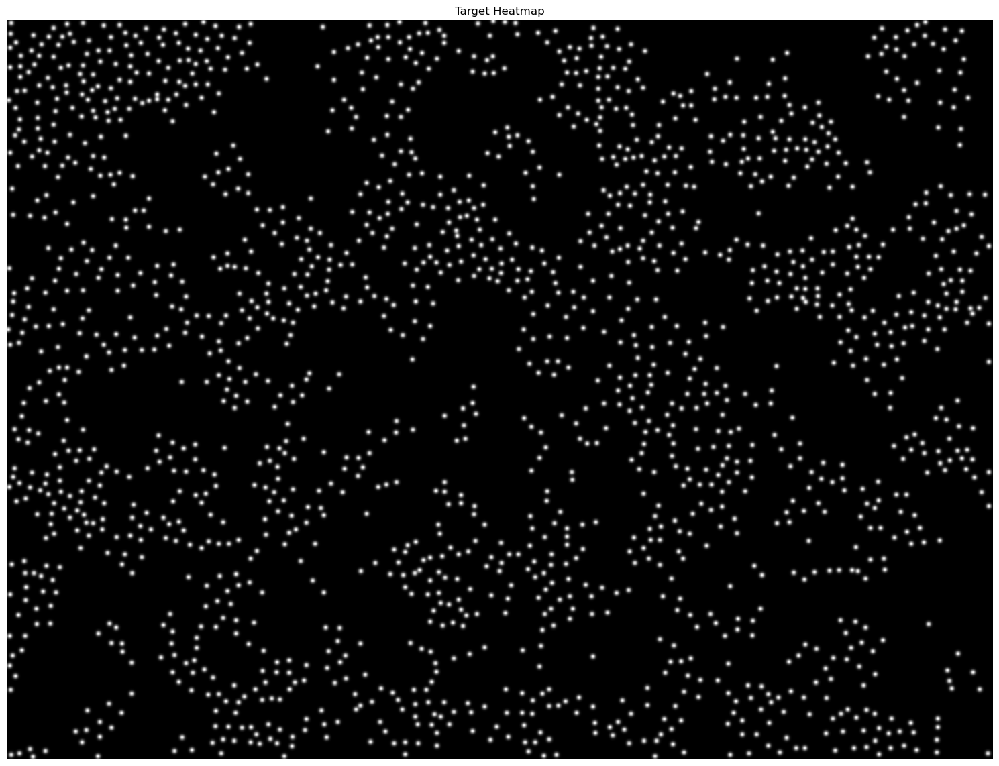

In [3]:

target = np.zeros_like(G)
# draw small gaussians at every point
for x,y in pos.astype(int):
  target[y,x] = 1  # pay attention to this weird swap
target = skimage.filters.gaussian(target, sigma=3.5, mode='constant')#*0.95   # 0.85 because its to hard for sigmoid to produce 1  

norm_factor = target.sum()
target = norm(target)
norm_factor = norm_factor / target.sum()
print(f"Normalization factor: {norm_factor}")

# reran with REDUCED NORM() and hope model learns to predict well
# NOTE: if applying normalization, the prediction should be corrected by the same factor to derive cell counts
# NOTE: maybe later I should change something about the sigmoid? (look at Xie et al. 2016)


#target = G; print("Setting target as G channel")   # NOTE change this back TODO

plot_image(target, title=f"Target Heatmap", scale=2.5)
target = torch.from_numpy(target).unsqueeze(0).unsqueeze(0).float().to(device)
input = torch.from_numpy(np.transpose(RGB, (2, 0, 1))).unsqueeze(0).float().to(device)
input2 = torch.from_numpy(np.transpose(RGB2, (2, 0, 1))).unsqueeze(0).float().to(device)
input4 = torch.from_numpy(np.transpose(RGB4, (2, 0, 1))).unsqueeze(0).float().to(device)

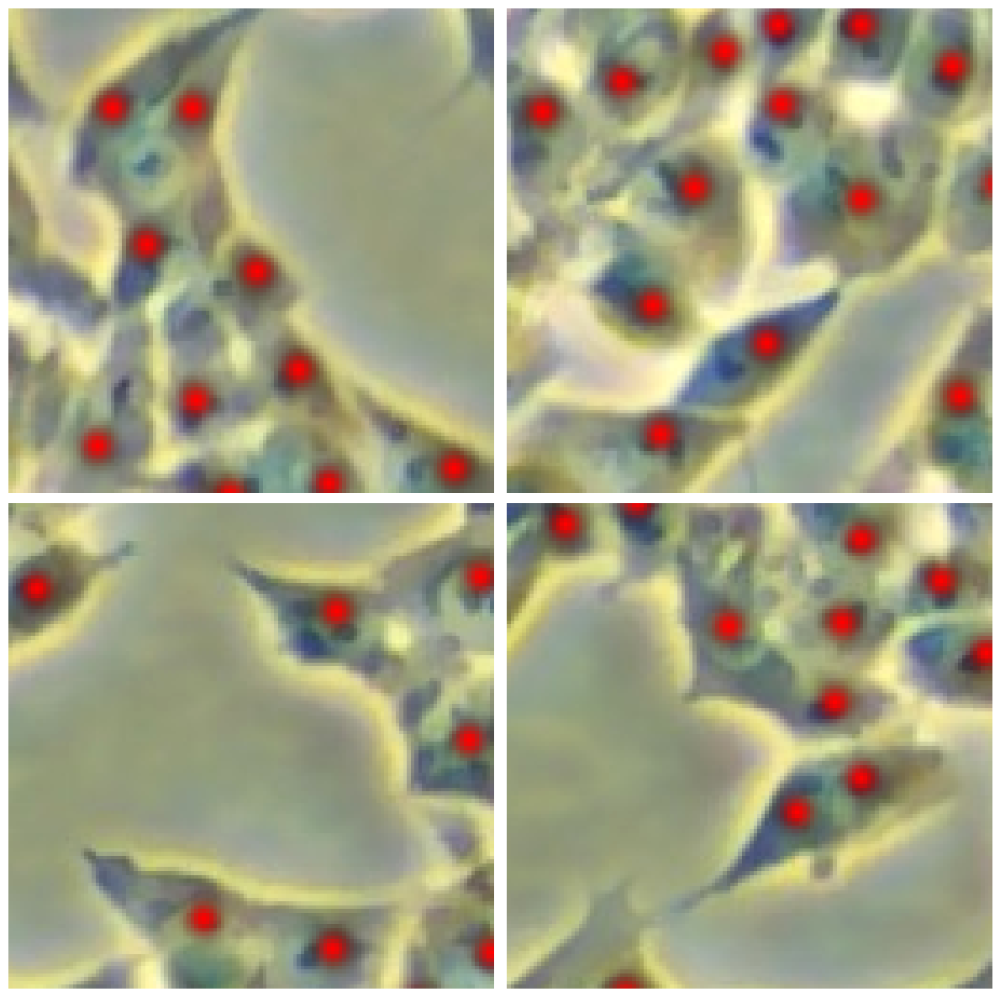

In [4]:

def sample_tile(X, Y, size):
  """Sample a tile of size `size` from the image X and the mask Y"""
  c,h,w = X.shape[-3:]
  x = np.random.randint(0, w - size)
  y = np.random.randint(0, h - size)
  return X[..., y:y+size, x:x+size], Y[..., y:y+size, x:x+size]

def batch_tiles(X, Y, size, n):
  """Sample n tiles of size `size` from the image X and the mask Y"""
  Xs, Ys = zip(*[sample_tile(X, Y, size) for _ in range(n)])
  return torch.stack(Xs), torch.stack(Ys)


# plot a few sampled tiles
fig, axs = mk_fig(2,2, scale=1, shape=(128,128))
for ax in axs:
  X,Y = sample_tile(input, target, 128)

  X,Y = X[0].cpu().numpy(), Y[0].cpu().numpy()

  heat = norm(np.stack([Y[0],Z:=np.zeros_like(Y[0]),Z,Y[0]], axis=-1))
  
  plot_image(np.transpose(X, (1,2,0)), ax=ax)
  plot_image(heat, ax=ax)

In [5]:
model = smp.Unet(
  encoder_name="resnet34",   
  encoder_weights=None,  
  in_channels=3,
  classes=1,
  activation='sigmoid',
)
model.to(device)

model

Unet(
  (encoder): ResNetEncoder(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track

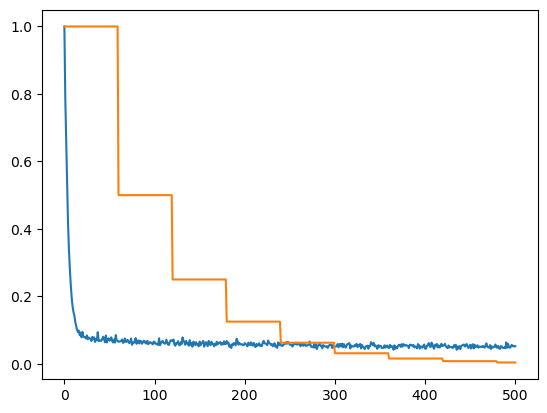

In [6]:

# train the model in a simple pytorch loop
LOG = []

n_epochs = 501 if CUDA else 51
batch_size = 32 if CUDA else 8

optimizer = torch.optim.Adam(model.parameters(), lr=2e-3)   # THIS STEP: tried to increase the learning rate because the unnormalized GT is 1e2 smaller in sum
criterion = torch.nn.MSELoss()
#scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience=10, verbose=True)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=60, gamma=0.5)
model.train()

for epoch in range(n_epochs):
  model.train()
  optimizer.zero_grad()

  X,Y = batch_tiles(input[0], target[0], 128, batch_size)

  pred = model(X)
  loss = criterion(pred, Y)

  loss.backward()
  optimizer.step()
 
  if epoch % 1 == 0:
    with torch.no_grad():
      model.eval()
   #   pred = model(input)
   #   pred2 = model(input2)

      LOG.append(dict(
        epoch = epoch,
        loss = loss.item(),
        lr = optimizer.param_groups[0]['lr'],
  #      pred = pred[0].detach().cpu().numpy(),
  #      pred2 = pred2[0].detach().cpu().numpy(),
      ))
  
  scheduler.step()#(loss.item())

losses = np.array([x['loss'] for x in LOG]); 
#print(list(losses[:5])); losses[:5] = 0  # first few will be very high, we can see the training convergence better if they are left out
losses /= losses.max()
lrs = np.array([x['lr'] for x in LOG]); lrs /= lrs.max()
plt.plot(losses, label='loss')
plt.plot(lrs, label='lr')

Sums: target: 133569.77, pred: 176215.88, pred2: 164919.30, pred4: 157661.09
Mins: target: 0.00, pred: 0.00, pred2: 0.00, pred4: 0.00
Maxs: target: 1.00, pred: 0.68, pred2: 0.68, pred4: 0.68

Counts: target: 1764.776123046875, pred: 2328.233642578125, pred2: 2178.978759765625, pred4: 2083.08056640625


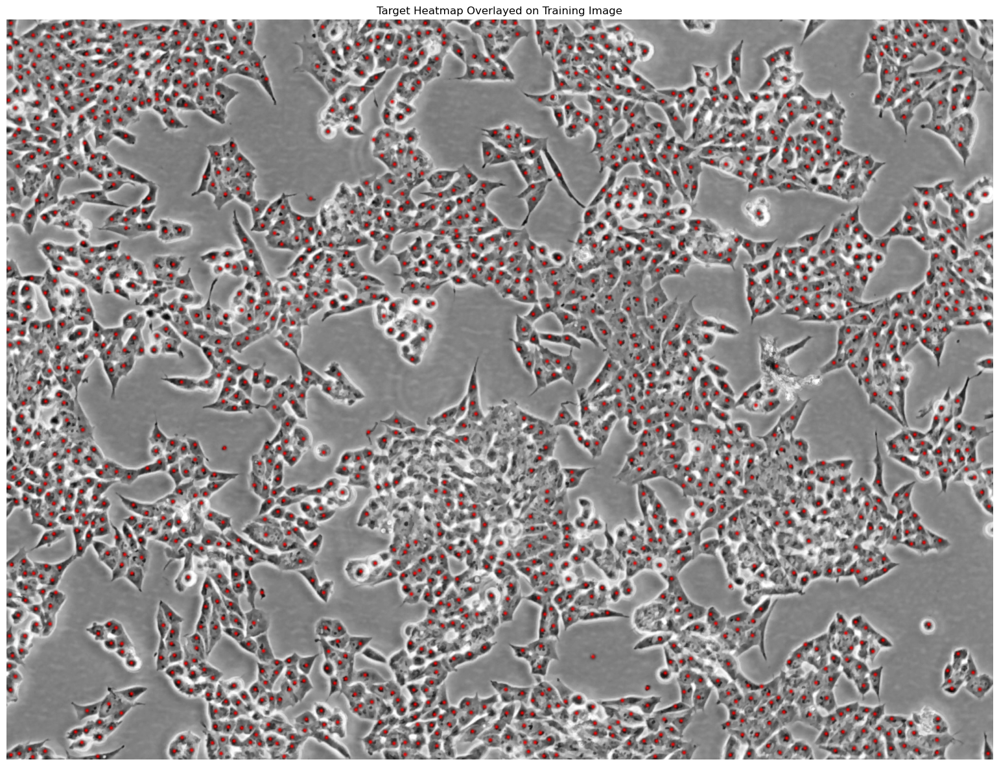

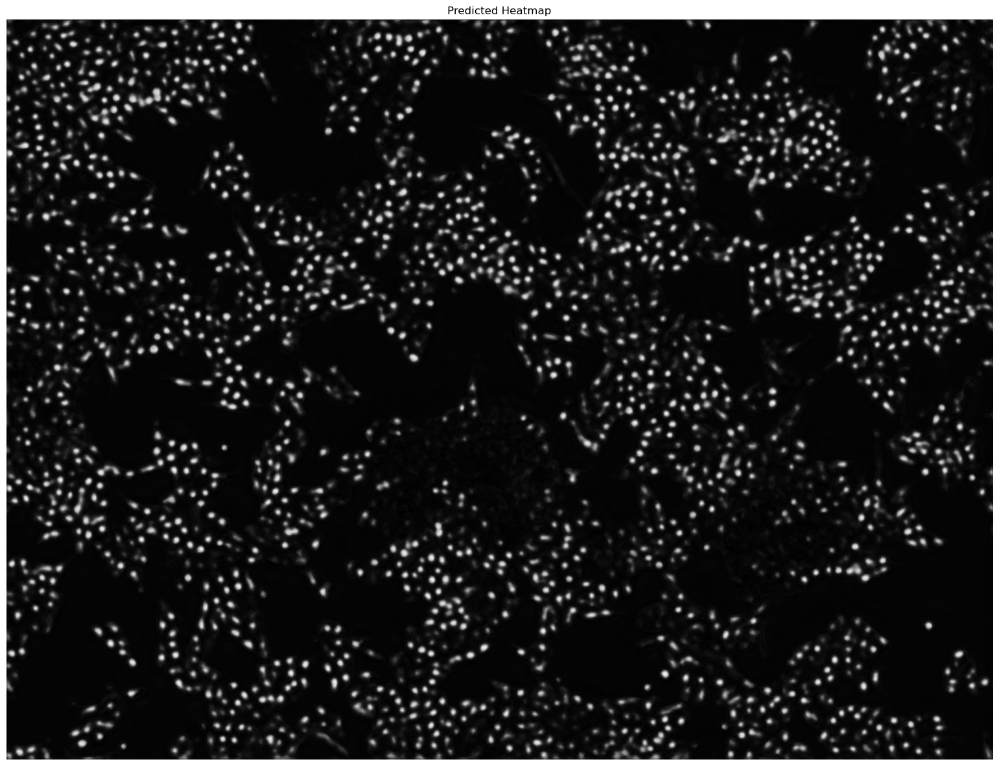

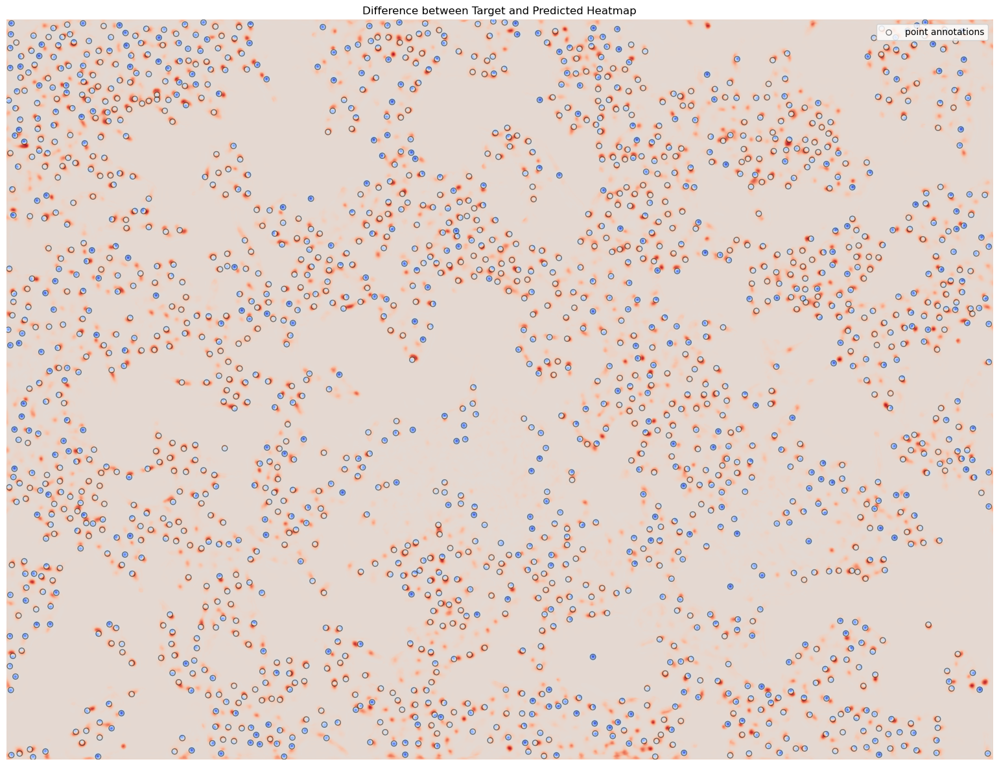

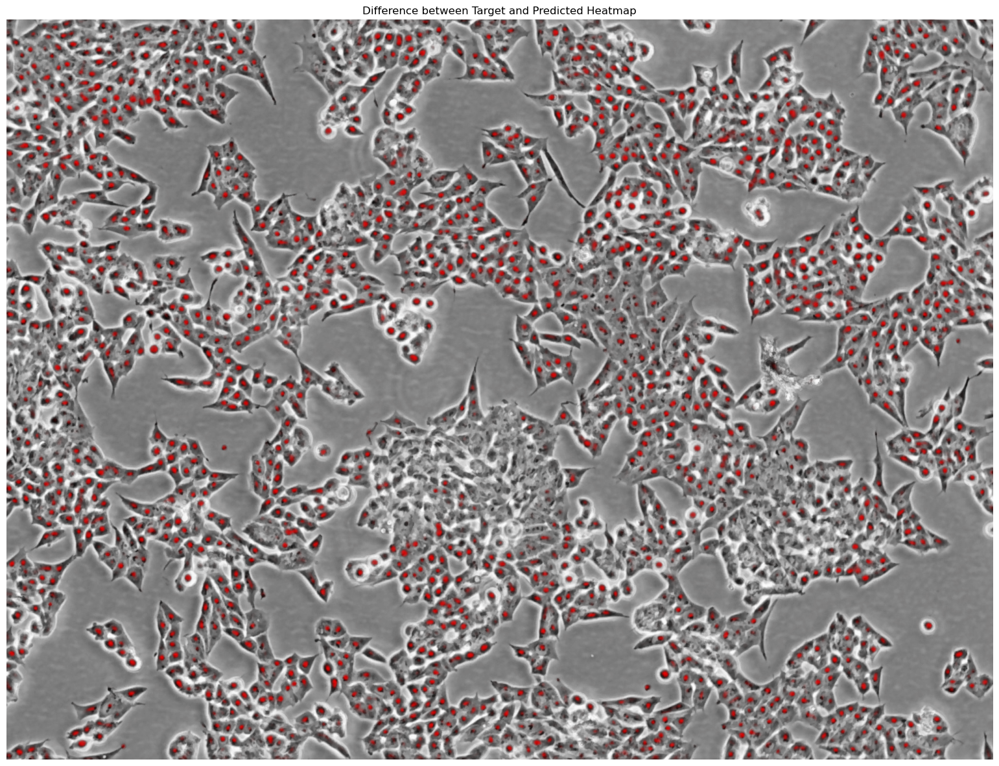

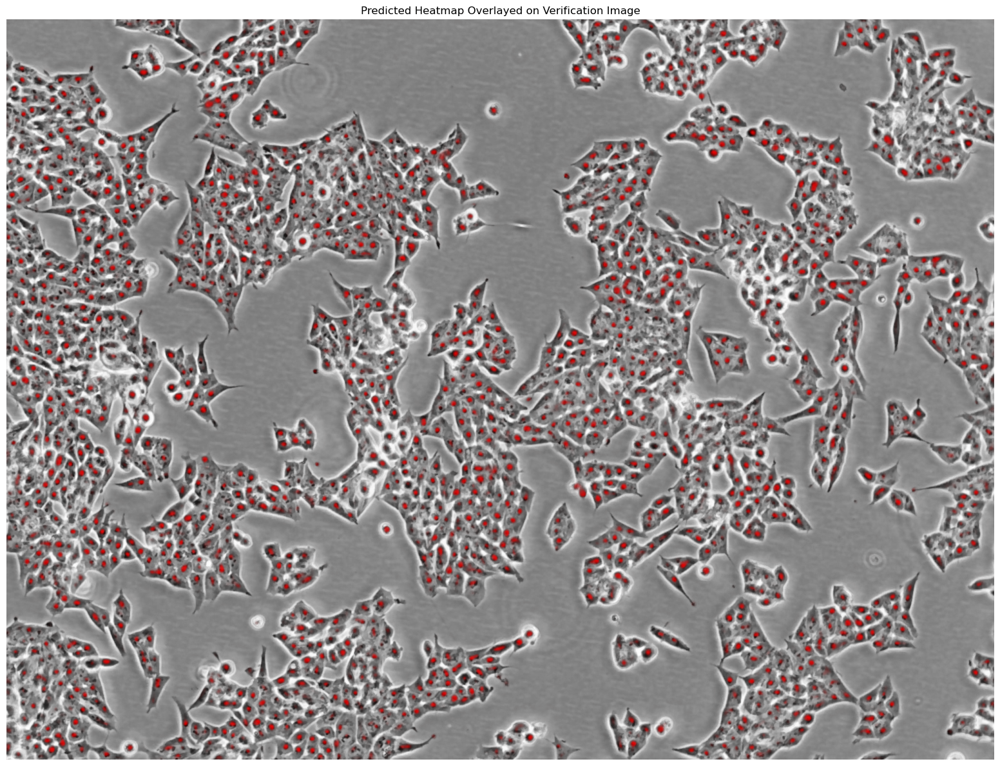

In [7]:

model.eval()
with torch.no_grad():
  pred = model(input).detach().cpu().numpy()[0][0]
  pred2 = model(input2).detach().cpu().numpy()[0][0]
  pred4 = model(input4).detach().cpu().numpy()[0][0]

axs = []
for i in range(5):
  axs.append(mk_fig(1,1, scale=2, shape=target.shape[-2:])[1])

targ = target[0,0].detach().cpu().numpy()
inp = input[0,1].detach().cpu().numpy()
inp2 = input2[0,1].detach().cpu().numpy()

plot_points = lambda ax: ax.scatter(pos[:,1], pos[:,0], c='magenta', s=8**2, marker='+', label="Target points")

title = F"Target Heatmap Overlayed on Training Image"
heat = norm(np.stack([targ, Z:=np.zeros_like(targ),Z,targ], axis=-1))
plot_image(inp, ax=axs[0], title=title)
plot_image(heat, ax=axs[0], title=title)


plot_image(pred, ax=axs[1], title=f"Predicted Heatmap")

title = f"Difference between Target and Predicted Heatmap"
plot_image(norm(pred)-norm(targ), ax=axs[2], title=title, cmap='coolwarm')
# plot annotated points
axs[2].scatter(pos[:,0], pos[:,1], facecolors='none', edgecolors='black', marker='o', label="point annotations", alpha=0.5, linewidths=1)
# add a legend to top right
axs[2].legend(loc='upper right')

heat = norm(np.stack([pred, Z:=np.zeros_like(pred),Z,pred], axis=-1))
plot_image(inp, ax=axs[3], title=title)
plot_image(heat, ax=axs[3], title=title)

title = F"Predicted Heatmap Overlayed on Verification Image"
heat = norm(np.stack([pred2, Z:=np.zeros_like(pred2),Z,pred2], axis=-1))
plot_image(inp2, ax=axs[4], title=title)
plot_image(heat, ax=axs[4], title=title)


print(f"Sums: target: {targ.sum():.2f}, pred: {pred.sum():.2f}, pred2: {pred2.sum():.2f}, pred4: {pred4.sum():.2f}")
print(f"Mins: target: {targ.min():.2f}, pred: {pred.min():.2f}, pred2: {pred2.min():.2f}, pred4: {pred4.min():.2f}")
print(f"Maxs: target: {targ.max():.2f}, pred: {pred.max():.2f}, pred2: {pred2.max():.2f}, pred4: {pred4.max():.2f}")
print(f"\nCounts: target: {target.sum()*norm_factor}, pred: {pred.sum()*norm_factor}, pred2: {pred2.sum()*norm_factor}, pred4: {pred4.sum()*norm_factor}")

